
# 6CS012 - Artificial Intelligence and Machine Learning


 ### Image Classification using Neural Network Architecture


### Name: Raj Prajapati <br> Uni Id: 2418626



Dataset: Sign lanGuage dedection.

## Task 1. Data Understanding
1.1  Data Analysis:

- load Data
-count no of data in dataset
- split the dataset


In [2]:
from google.colab import drive #mounting drive
drive.mount('/content/drive')

Mounted at /content/drive


import necessary libaries

In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
from PIL import Image
import shutil
import random

In [4]:
dataset= '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection' #load dataset

In [5]:
def count_pictures(folder_path):
    picture_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.isfile(os.path.join(root, file)):
                picture_count += 1
    return picture_count

# Count pictures in the main folder and its subdirectories
total_pictures = 0
directory_names = []
picture_counts = []

for root, dirs, files in os.walk(dataset):
      # Checking if there are files in the current directory
    if len(files) > 0:
        picture_count = count_pictures(root)
        print("Directory:", root)
        print("Number of pictures:", picture_count)
        total_pictures += picture_count
        directory_names.append(root)
        picture_counts.append(picture_count)
# Print the total number of pictures found in all directories
print("Total number of pictures:", total_pictures)
print("-----------------------------")


Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection
Number of pictures: 15185
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Test
Number of pictures: 3
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/5
Number of pictures: 287
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/6
Number of pictures: 284
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/7
Number of pictures: 282
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/4
Number of pictures: 239
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/8
Number of pictures: 290
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/34
Number of pictures: 283
Directory: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train/37
Number of pictures: 289
Directory: /content/drive/MyDrive/AI_ML_assess

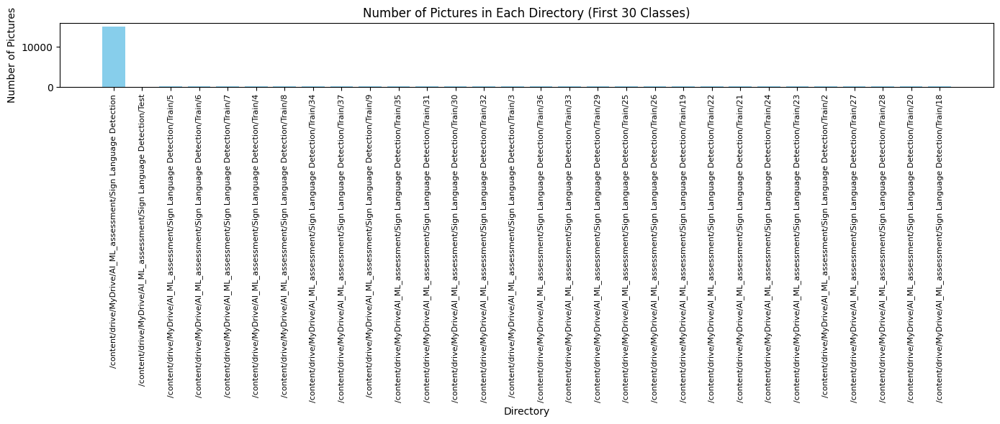

In [7]:
import matplotlib.pyplot as plt

def plot_bar_chart(directory_names, picture_counts):

    # Keep only first 30 classes
    directory_names = directory_names[:30]
    picture_counts = picture_counts[:30]

    plt.figure(figsize=(14, 6))

    plt.bar(directory_names, picture_counts, color='skyblue')

    plt.xlabel('Directory')
    plt.ylabel('Number of Pictures')
    plt.title('Number of Pictures in Each Directory (First 30 Classes)')

    plt.xticks(rotation=90, fontsize=8)

    plt.tight_layout()
    plt.show()


# Plot
plot_bar_chart(directory_names, picture_counts)

In [8]:
import os
import shutil
import random

def split_dataset(dataset, train_split=0.6, test_split=0.2, validate_split=0.2):

    # Parent directory
    base_dir = os.path.dirname(dataset)

    # Existing train folder
    train_folder = dataset

    # Create test and validate folders
    test_folder = os.path.join(base_dir, "test")
    validate_folder = os.path.join(base_dir, "validate")

    os.makedirs(test_folder, exist_ok=True)
    os.makedirs(validate_folder, exist_ok=True)

    # Get class folders (0 to 37)
    classes = [
        cls for cls in os.listdir(dataset)
        if os.path.isdir(os.path.join(dataset, cls))
    ]

    print("Classes found:", classes)

    train_count = 0
    test_count = 0
    validate_count = 0

    # Process each class
    for cls in classes:

        class_path = os.path.join(dataset, cls)

        # Get all images
        images = os.listdir(class_path)

        # Shuffle images randomly
        random.shuffle(images)

        total_images = len(images)

        # Calculate split sizes
        num_train = int(total_images * train_split)
        num_test = int(total_images * test_split)

        # Split images
        train_images = images[:num_train]
        test_images = images[num_train:num_train + num_test]
        validate_images = images[num_train + num_test:]

        # Create class folders inside test and validate
        os.makedirs(os.path.join(test_folder, cls), exist_ok=True)
        os.makedirs(os.path.join(validate_folder, cls), exist_ok=True)

        # Move test images
        for image in test_images:

            src = os.path.join(class_path, image)
            dst = os.path.join(test_folder, cls, image)

            shutil.copyfile(src, dst)

        # Move validate images
        for image in validate_images:

            src = os.path.join(class_path, image)
            dst = os.path.join(validate_folder, cls, image)

            shutil.copyfile(src, dst)

        train_count += len(train_images)
        test_count += len(test_images)
        validate_count += len(validate_images)

        print(f"Class {cls}")
        print(f"Train: {len(train_images)}")
        print(f"Test: {len(test_images)}")
        print(f"Validate: {len(validate_images)}")
        print("-" * 30)

    return train_count, test_count, validate_count


# Dataset path
dataset = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train"

# Run split
train_count, test_count, validate_count = split_dataset(dataset)

# Final counts
print("\nFINAL DATASET SPLIT")
print("Train images:", train_count)
print("Test images:", test_count)
print("Validation images:", validate_count)


Classes found: ['5', '6', '7', '4', '8', '34', '37', '9', '35', '31', '30', '32', '3', '36', '33', '29', '25', '26', '19', '22', '21', '24', '23', '2', '27', '28', '20', '18', '14', '16', '15', '17', '12', '11', '0', '13', '1', '10']
Class 5
Train: 172
Test: 57
Validate: 58
------------------------------
Class 6
Train: 170
Test: 56
Validate: 58
------------------------------
Class 7
Train: 169
Test: 56
Validate: 57
------------------------------
Class 4
Train: 143
Test: 47
Validate: 49
------------------------------
Class 8
Train: 174
Test: 58
Validate: 58
------------------------------
Class 34
Train: 169
Test: 56
Validate: 58
------------------------------
Class 37
Train: 173
Test: 57
Validate: 59
------------------------------
Class 9
Train: 171
Test: 57
Validate: 57
------------------------------
Class 35
Train: 167
Test: 55
Validate: 57
------------------------------
Class 31
Train: 172
Test: 57
Validate: 59
------------------------------
Class 30
Train: 171
Test: 57
Validate: 57


1.2 Data Visualization:

*   visaualize images per class (according to no of classification made)
*   Check for corrupted image













In [19]:
train_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train"
test_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test"
validate_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/validate"

In [10]:
def check_corrupted_images(directory):
    # List to hold paths of corrupted image files
    corrupted_images = []
    for root, _, files in os.walk(directory):
        for file in files:
            image_path = os.path.join(root, file)
            try:
                img = Image.open(image_path)
                img.verify()
            except (IOError, SyntaxError):
                  # Add the path to the list if an image is corrupted
                corrupted_images.append(image_path)
    # Return the list of corrupted image paths
    return corrupted_images

# Check for corrupted images in each directory
corrupted_train_images = check_corrupted_images(train_dir)
corrupted_test_images = check_corrupted_images(test_dir)
corrupted_validate_images = check_corrupted_images(validate_dir)

print("Number of corrupted images in train set:", len(corrupted_train_images))
print("Number of corrupted images in test set:", len(corrupted_test_images))
print("Number of corrupted images in validate set:", len(corrupted_validate_images))


Number of corrupted images in train set: 0
Number of corrupted images in test set: 0
Number of corrupted images in validate set: 0


In [50]:
def remove_corrupted_images(image_paths):
    for image_path in image_paths:
        try:
            os.remove(image_path)
            print(f"Removed corrupted image: {image_path}")
        except OSError as e:
            print(f"Error removing {image_path}: {e}")

print("Removing corrupted images from train set...")
remove_corrupted_images(corrupted_train_images)

print("Removing corrupted images from test set...")
remove_corrupted_images(corrupted_test_images)

print("Removing corrupted images from validate set...")
remove_corrupted_images(corrupted_validate_images)

print("Corrupted image removal complete.")


Removing corrupted images from train set...
Removing corrupted images from test set...
Removing corrupted images from validate set...
Corrupted image removal complete.


Visualizing images from TRAIN folder


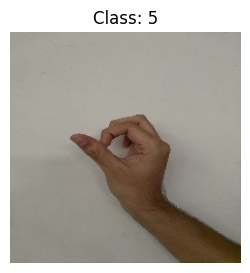

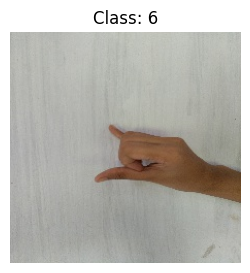

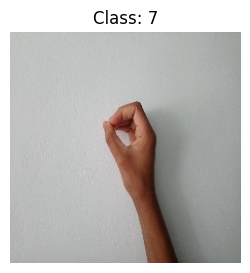

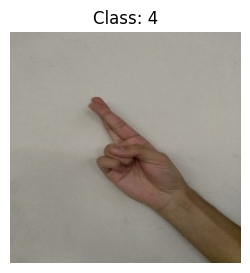

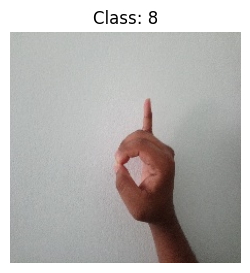

...

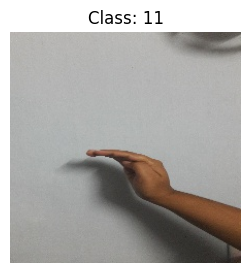

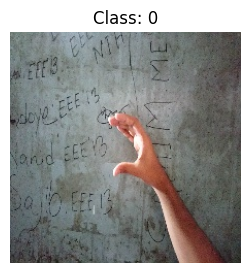

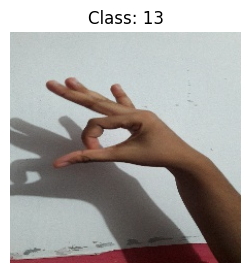

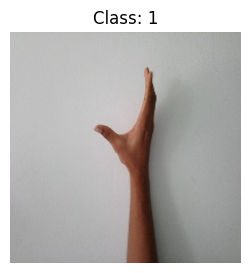

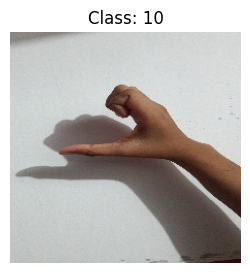

Visualizing images from TEST folder
Visualizing images from VALIDATE folder


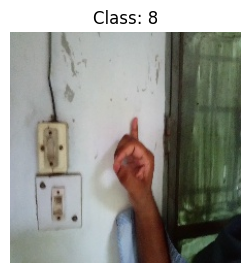

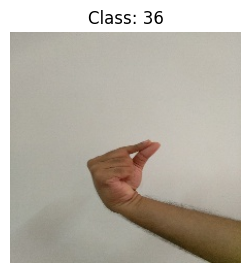

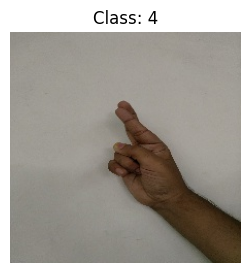

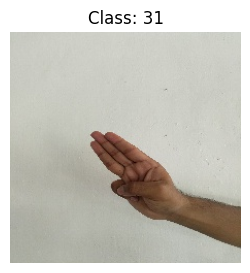

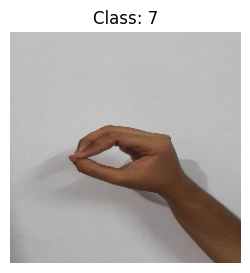

...

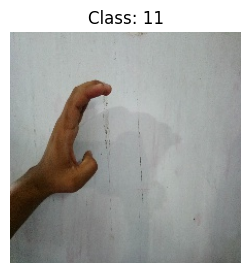

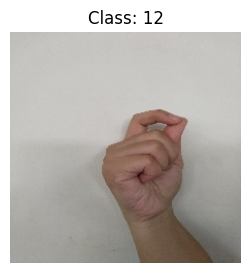

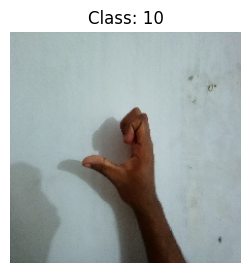

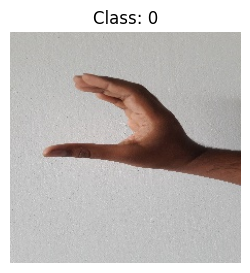

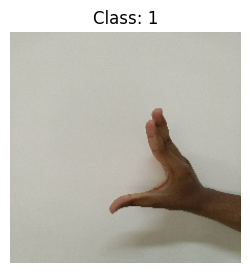

In [12]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def visualize_images(folder):

    classes = os.listdir(folder)

    for cls in classes:

        class_path = os.path.join(folder, cls)

        # Skip if not directory
        if not os.path.isdir(class_path):
            continue

        # Select random image
        image_name = random.choice(os.listdir(class_path))
        image_path = os.path.join(class_path, image_name)

        # Read image
        img = mpimg.imread(image_path)

        # Display image
        plt.figure(figsize=(3,3))
        plt.imshow(img)
        plt.title(f"Class: {cls}")
        plt.axis('off')
        plt.show()


# Folder paths are already defined in cell 2B2kORcYXfVi, no need to redefine here
train_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Train"
test_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/Test"
validate_dir = "/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/validate"

# Visualize images
print("Visualizing images from TRAIN folder")
visualize_images(train_dir)

print("Visualizing images from TEST folder")
visualize_images(test_dir)

print("Visualizing images from VALIDATE folder")
visualize_images(validate_dir)


1.3 Data Pre-Processing


*   what kind of data generator has been used
*   visualize augmented image if done



In [13]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

Found 10792 images belonging to 38 classes.
Found 0 images belonging to 0 classes.
Found 3959 images belonging to 38 classes.
Class Indices:
{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '13': 5, '14': 6, '15': 7, '16': 8, '17': 9, '18': 10, '19': 11, '2': 12, '20': 13, '21': 14, '22': 15, '23': 16, '24': 17, '25': 18, '26': 19, '27': 20, '28': 21, '29': 22, '3': 23, '30': 24, '31': 25, '32': 26, '33': 27, '34': 28, '35': 29, '36': 30, '37': 31, '4': 32, '5': 33, '6': 34, '7': 35, '8': 36, '9': 37}


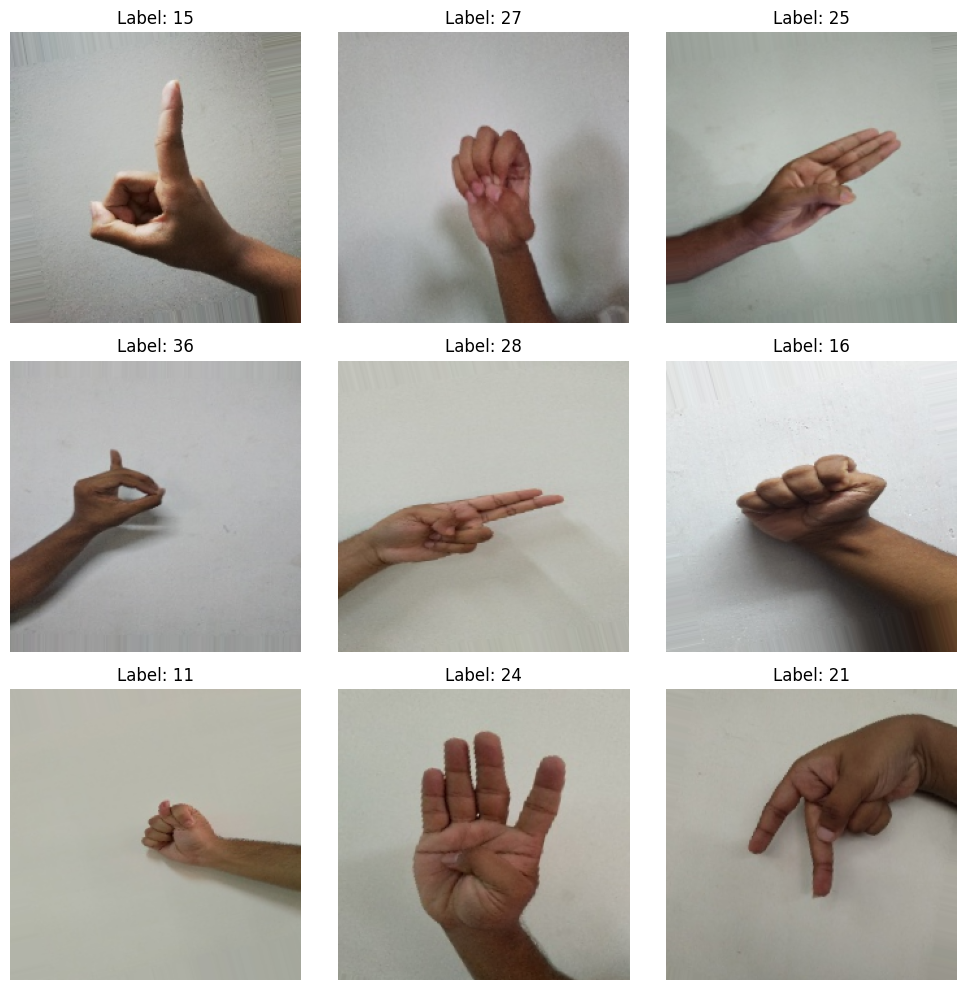

In [14]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Image size
img_height = 224
img_width = 224

# Batch size
batch_size = 32

# Epochs
epochs = 10

# =========================
# TRAIN DATA GENERATOR
# =========================

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    zoom_range=0.2,
    shear_range=0.2,
    horizontal_flip=True
)

# =========================
# TEST & VALIDATION GENERATOR
# =========================

test_val_datagen = ImageDataGenerator(
    rescale=1./255
)

# =========================
# TRAIN GENERATOR
# =========================

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=True
)

# =========================
# TEST GENERATOR
# =========================

test_generator = test_val_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False
)

# =========================
# VALIDATION GENERATOR
# =========================

validate_generator = test_val_datagen.flow_from_directory(
    validate_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False
)

# =========================
# CLASS LABELS
# =========================

print("Class Indices:")
print(train_generator.class_indices)

# =========================
# VISUALIZE IMAGES
# =========================

images, labels = next(train_generator)

plt.figure(figsize=(10, 10))

for i in range(9):

    ax = plt.subplot(3, 3, i + 1)

    plt.imshow(images[i])

    plt.title(f"Label: {int(labels[i])}")

    plt.axis("off")

plt.tight_layout()
plt.show()

In [15]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# =========================
# IMAGE SETTINGS
# =========================

img_height = 224
img_width = 224
batch_size = 32

# =========================
# VALIDATION GENERATOR
# =========================

test_datagen = ImageDataGenerator(
    rescale=1./255
)

validation_generator = test_datagen.flow_from_directory(
    validate_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse'
)

# =========================
# NUMBER OF CLASSES
# =========================

num_classes = 38

# =========================
# MODEL
# =========================

model = Sequential([

    # Convert image to 1D vector
    Flatten(input_shape=(img_height, img_width, 3)),

    # Hidden layer 1
    Dense(128, activation='relu'),

    # Hidden layer 2
    Dense(64, activation='relu'),

    # Output layer
    Dense(num_classes, activation='softmax')
])

# =========================
# COMPILE MODEL
# =========================

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# =========================
# MODEL SUMMARY
# =========================

model.summary()

Found 3959 images belonging to 38 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    19,267,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 38)             │         2,470 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,278,438 (73.54 MB)

 Trainable params: 19,278,438 (73.54 MB)

 Non-trainable params: 0 (0.00 B)

The model summary shows a Sequential Neural Network used for sign language image classification into 38 classes. The architecture consists of a Flatten layer followed by two Dense hidden layers with ReLU activation and an output Dense layer with Softmax activation. The model contains approximately millions of trainable parameters and is trained to classify sign language gestures from image inputs.

## Task 2 : Building Fully Connected Neural Network

2.1 Model Building

this model is vanilla model which will have your own artitecture you will think which layer is suited for the images based on input image
- CNN and FNN are different

model summary shoulsd be explainable.



In [44]:
# Train the model
history = model.fit(
    train_generator,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=validation_generator
)

# SAVE MODEL AFTER TRAINING
model.save("cnn_sign_language_model.h5")

Epoch 1/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 209s 619ms/step - accuracy: 0.0233 - loss: 3.6376 - val_accuracy: 0.0283 - val_loss: 3.6370
Epoch 2/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 204s 604ms/step - accuracy: 0.0256 - loss: 3.6376 - val_accuracy: 0.0283 - val_loss: 3.6370
Epoch 3/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 204s 603ms/step - accuracy: 0.0241 - loss: 3.6376 - val_accuracy: 0.0270 - val_loss: 3.6370
Epoch 4/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 205s 606ms/step - accuracy: 0.0257 - loss: 3.6376 - val_accuracy: 0.0283 - val_loss: 3.6370
Epoch 5/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 203s 602ms/step - accuracy: 0.0262 - loss: 3.6376 - val_accuracy: 0.0270 - val_loss: 3.6370
Epoch 6/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 205s 607ms/step - accuracy: 0.0249 - loss: 3.6376 - val_accuracy: 0.0270 - val_loss: 3.6370
Epoch 7/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 201s 594ms/step - accuracy: 0.0271 - loss: 3.6376 - val_accuracy: 0.0270 - val_loss: 3.6371
Epoch 8/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 204s 602ms/step - accuracy: 0.0238 -

2.3 Evaluate the Model

- appropriate evaluation metric
compare with test and train
- visualize

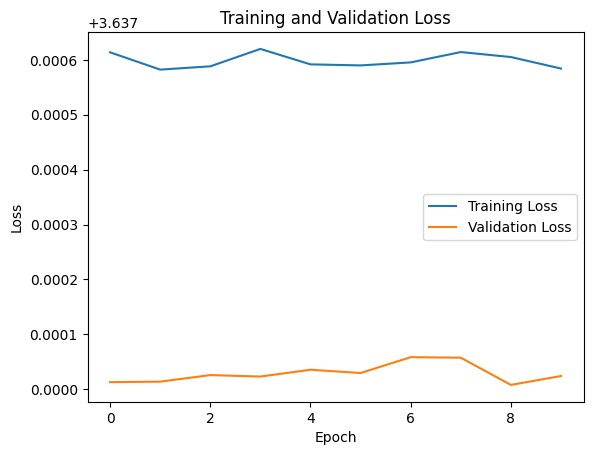

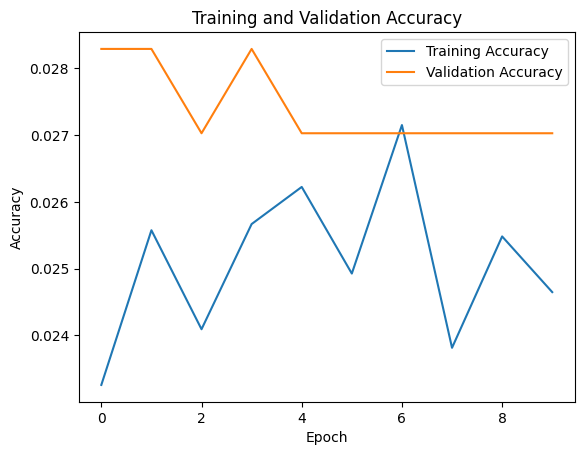

In [45]:
# Plot the loss graph
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot the accuracy graph
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [46]:
import tensorflow as tf
import os
from PIL import Image # Needed for potential image verification

img_height = 224
img_width = 224
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE


valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")


# Step 1: Collect valid file paths only and verify images
def get_files_and_verify(directory):
    files = []
    labels = []

    # Get class names from directory structure
    class_names_in_dir = sorted([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])

    # Create a mapping from class_name string to integer label
    class_name_to_label = {name: i for i, name in enumerate(class_names_in_dir)}

    for class_name_str in class_names_in_dir:
        class_path = os.path.join(directory, class_name_str)
        current_label = class_name_to_label[class_name_str]

        for f in os.listdir(class_path):
            file_path = os.path.join(class_path, f)
            if os.path.isfile(file_path) and f.lower().endswith(valid_exts):
                try:
                    # Use PIL to verify image integrity before adding to the list
                    img = Image.open(file_path)
                    img.verify() # Checks if the file is a valid image
                    files.append(file_path)
                    labels.append(current_label)
                except (IOError, SyntaxError, Image.UnidentifiedImageError) as e:
                    print(f"Skipping corrupted or unidentifiable image: {file_path} - Error: {e}")
                except Exception as e: # Catch any other unexpected errors during PIL verification
                    print(f"Skipping file due to unexpected error during PIL check: {file_path} - Error: {e}")
    return files, labels, class_names_in_dir

files, labels, class_names = get_files_and_verify(test_dir)

print("Total valid files found:", len(files))


# Step 2: Create dataset from valid file paths and labels
dataset = tf.data.Dataset.from_tensor_slices((tf.constant(files), tf.constant(labels, dtype=tf.int32)))


# Step 3: Robust loader and preprocessor for images
def load_image_and_preprocess(path, label):
    img_bytes = tf.io.read_file(path)
    try:
        # Decode image without forcing channels first, then handle channels explicitly
        img = tf.image.decode_image(img_bytes, expand_animations=False)

        # Ensure image has 3 channels
        img_rank = tf.rank(img)
        if tf.not_equal(img_rank, 3): # If not a 3D image (e.g., empty or 1D/2D after decode)
            # Create a placeholder if not a proper image (should be rare after PIL check)
            final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)
        else:
            num_channels = tf.shape(img)[-1]
            if num_channels == 1:
                final_img = tf.image.grayscale_to_rgb(img)
            elif num_channels > 3:
                final_img = img[:, :, :3] # Take only the first 3 channels (e.g., discard alpha)
            elif num_channels == 3:
                final_img = img # Already 3 channels
            else: # Handle other unexpected channel counts, e.g., 2
                final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)

        # Resize and rescale the image
        final_img = tf.image.resize(final_img, (img_height, img_width))
        final_img = tf.cast(final_img, tf.float32) / 255.0

        return final_img, label

    except tf.errors.InvalidArgumentError as e:
        # Catch specific TensorFlow decoding errors and return a dummy image
        # Removed .numpy() as it's not compatible with SymbolicTensor in graph mode
        tf.print(f"TensorFlow decoding error for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), label
    except Exception as e:
        # Catch any other generic errors during preprocessing
        # Removed .numpy() as it's not compatible with SymbolicTensor in graph mode
        tf.print(f"Generic error in load_image_and_preprocess for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), label


dataset = dataset.map(load_image_and_preprocess, num_parallel_calls=AUTOTUNE)


# Step 4: batch + speed optimization
dataset = dataset.batch(batch_size).prefetch(AUTOTUNE)


# Step 5: evaluate
test_loss, test_accuracy = model.evaluate(dataset)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


Skipping corrupted or unidentifiable image: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg'
Skipping corrupted or unidentifiable image: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg'
Skipping corrupted or unidentifiable image: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg'
Skipping corrupted or unidentifiable image: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/20180716_003635.jpg - Error: cannot identify image file '/content/drive/MyDri

In [59]:
from tensorflow.keras.models import load_model

model = load_model('/content/cnn_sign_language_model.h5')
print("Model loaded successfully from /content/cnn_sign_language_model.h5")

Model loaded successfully from /content/cnn_sign_language_model.h5


In [61]:
import os

model_path = "/content/cnn_sign_language_model.h5"
if os.path.exists(model_path):
    print(f"The model file '{model_path}' exists.")
else:
    print(f"The model file '{model_path}' does NOT exist.")


The model file '/content/cnn_sign_language_model.h5' exists.


2.4 Prediction

In [62]:
import numpy as np
import tensorflow as tf
from PIL import Image
import os

# Ensure img_height, img_width, batch_size, AUTOTUNE, test_dir are defined
# Re-using definitions from vUYTHq9qZLkK to ensure consistency
img_height = 224
img_width = 224
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")

# --- Re-implementing robust data loading for prediction ---

def get_files_and_verify(directory):
    files = []
    labels = []
    class_names_in_dir = sorted([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])
    class_name_to_label = {name: i for i, name in enumerate(class_names_in_dir)}

    for class_name_str in class_names_in_dir:
        class_path = os.path.join(directory, class_name_str)
        current_label = class_name_to_label[class_name_str]

        for f in os.listdir(class_path):
            file_path = os.path.join(class_path, f)
            if os.path.isfile(file_path) and f.lower().endswith(valid_exts):
                try:
                    img = Image.open(file_path)
                    img.verify()
                    files.append(file_path)
                    labels.append(current_label)
                except (IOError, SyntaxError, Image.UnidentifiedImageError) as e:
                    print(f"Skipping corrupted or unidentifiable image during path collection: {file_path} - Error: {e}")
                except Exception as e:
                    print(f"Skipping file due to unexpected error during path collection: {file_path} - Error: {e}")
    return files, labels, class_names_in_dir

# Get files for the test directory
pred_files, pred_labels, pred_class_names = get_files_and_verify(test_dir)

# Create dataset from valid file paths and labels
pred_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(pred_files), tf.constant(pred_labels, dtype=tf.int32)))

# Robust loader and preprocessor for images (copied from vUYTHq9qZLkK)
def load_image_and_preprocess(path, label):
    img_bytes = tf.io.read_file(path)
    try:
        img = tf.image.decode_image(img_bytes, expand_animations=False)
        img_rank = tf.rank(img)
        if tf.not_equal(img_rank, 3):
            final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)
        else:
            num_channels = tf.shape(img)[-1]
            if num_channels == 1:
                final_img = tf.image.grayscale_to_rgb(img)
            elif num_channels > 3:
                final_img = img[:, :, :3]
            elif num_channels == 3:
                final_img = img
            else:
                final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)

        final_img = tf.image.resize(final_img, (img_height, img_width))
        final_img = tf.cast(final_img, tf.float32) / 255.0

        return final_img, label

    except tf.errors.InvalidArgumentError as e:
        tf.print(f"TensorFlow decoding error for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), label
    except Exception as e:
        tf.print(f"Generic error in load_image_and_preprocess for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), label

pred_dataset = pred_dataset.map(load_image_and_preprocess, num_parallel_calls=AUTOTUNE)

# Batch and prefetch the dataset
pred_dataset_batched = pred_dataset.batch(batch_size).prefetch(AUTOTUNE)

# Generate predictions for the input samples from the robust test dataset
predictions = model.predict(pred_dataset_batched)
predicted_classes = np.argmax(predictions, axis=1)

# The true labels for comparison will come from the pred_labels list
true_labels = np.array(pred_labels)

# Output the first ten predicted class indices and the actual class labels for comparison
print("Predictions (first 10):", predicted_classes[:10])
print("True Labels (first 10):", true_labels[:10])


Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language De

In [63]:
from sklearn.metrics import classification_report, confusion_matrix

# Classification Report
print("Classification Report:\n", classification_report(true_labels, predicted_classes))

# Confusion Matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)
print("Confusion Matrix:\n", conf_matrix)


Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       102
           1       0.00      0.00      0.00        99
           2       0.00      0.00      0.00       102
           3       0.00      0.00      0.00       103
           4       0.00      0.00      0.00        98
           5       0.00      0.00      0.00        99
           6       0.00      0.00      0.00        97
           7       0.00      0.00      0.00        95
           8       0.00      0.00      0.00       104
           9       0.00      0.00      0.00        97
          10       0.00      0.00      0.00       102
          11       0.00      0.00      0.00       102
          12       0.00      0.00      0.00       109
          13       0.00      0.00      0.00       102
          14       0.00      0.00      0.00       103
          15       0.03      1.00      0.05       104
          16       0.00      0.00      0.00       101
   

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


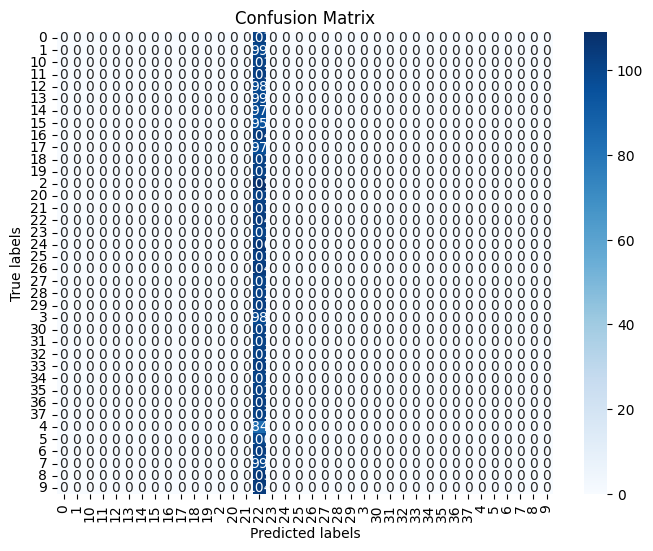

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


## Task3: Building Convolutional Neural Network

3.1 Model Building (Take another approach  for building the CNN )
similar to task 2 but build differntly use other features.

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense,
    Dropout,
    BatchNormalization
)

# =========================
# CNN MODEL FUNCTION
# =========================

def create_cnn(input_shape, num_classes):

    model = Sequential([

        # =========================
        # FIRST CONVOLUTION BLOCK
        # =========================

        Conv2D(
            32,
            (3, 3),
            activation='relu',
            input_shape=input_shape
        ),

        MaxPooling2D((2, 2)),

        # =========================
        # SECOND CONVOLUTION BLOCK
        # =========================

        Conv2D(
            64,
            (3, 3),
            activation='relu'
        ),

        MaxPooling2D((2, 2)),

        # =========================
        # THIRD CONVOLUTION BLOCK
        # =========================

        Conv2D(
            128,
            (3, 3),
            activation='relu'
        ),

        MaxPooling2D((2, 2)),

        # =========================
        # FOURTH CONVOLUTION BLOCK
        # =========================

        Conv2D(
            128,
            (3, 3),
            activation='relu'
        ),

        MaxPooling2D((2, 2)),

        # =========================
        # FLATTEN LAYER
        # =========================

        Flatten(),

        # =========================
        # FULLY CONNECTED LAYER
        # =========================

        Dense(
            512,
            activation='relu'
        ),

        # Reduce overfitting
        Dropout(0.5),

        # =========================
        # OUTPUT LAYER
        # =========================

        Dense(
            num_classes,
            activation='softmax'
        )
    ])

    return model


# =========================
# MODEL PARAMETERS
# =========================

input_shape = (224, 224, 3)

num_classes = 38

# =========================
# CREATE MODEL
# =========================

model = create_cnn(input_shape, num_classes)

# =========================
# COMPILE MODEL
# =========================

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# =========================
# MODEL SUMMARY
# =========================

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,698,022 (37.00 MB)

 Trainable params: 9,698,022 (37.00 MB)

 Non-trainable params: 0 (0.00 B)

In [66]:
import os
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# =========================
# IMAGE SETTINGS
# =========================

image_size = (224, 224)
batch_size = 32

# =========================
# DATA AUGMENTATION
# =========================

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# =========================
# TRAIN GENERATOR
# =========================

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# =========================
# VALIDATION GENERATOR
# =========================

validation_generator = test_datagen.flow_from_directory(
    validate_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# =========================
# NUMBER OF CLASSES (IMPORTANT FIX)
# =========================

num_classes = len(train_generator.class_indices)

print("Classes found:", num_classes)
print(train_generator.class_indices)

# =========================
# CREATE MODEL
# =========================

model = create_cnn(input_shape=(224, 224, 3), num_classes=num_classes)

model.summary()

# =========================
# COMPILE MODEL
# =========================

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

Found 10792 images belonging to 38 classes.
Found 3959 images belonging to 38 classes.
Classes found: 38
{'0': 0, '1': 1, '10': 2, '11': 3, '12': 4, '13': 5, '14': 6, '15': 7, '16': 8, '17': 9, '18': 10, '19': 11, '2': 12, '20': 13, '21': 14, '22': 15, '23': 16, '24': 17, '25': 18, '26': 19, '27': 20, '28': 21, '29': 22, '3': 23, '30': 24, '31': 25, '32': 26, '33': 27, '34': 28, '35': 29, '36': 30, '37': 31, '4': 32, '5': 33, '6': 34, '7': 35, '8': 36, '9': 37}


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,698,022 (37.00 MB)

 Trainable params: 9,698,022 (37.00 MB)

 Non-trainable params: 0 (0.00 B)

3.2 Train the Model

In [72]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size
)

Epoch 1/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 224s 664ms/step - accuracy: 0.0264 - loss: 3.6377 - val_accuracy: 0.0269 - val_loss: 3.6370
Epoch 2/10
  1/337 ━━━━━━━━━━━━━━━━━━━━ 27s 81ms/step - accuracy: 0.0312 - loss: 3.6424

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.0312 - loss: 3.6424 - val_accuracy: 0.0272 - val_loss: 3.6370
Epoch 3/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 230s 682ms/step - accuracy: 0.0269 - loss: 3.6378 - val_accuracy: 0.0267 - val_loss: 3.6371
Epoch 4/10
  1/337 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - accuracy: 0.0625 - loss: 3.6374

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.0625 - loss: 3.6374 - val_accuracy: 0.0272 - val_loss: 3.6371
Epoch 5/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 220s 652ms/step - accuracy: 0.0244 - loss: 3.6378 - val_accuracy: 0.0269 - val_loss: 3.6371
Epoch 6/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.0000e+00 - loss: 3.6406 - val_accuracy: 0.0272 - val_loss: 3.6370
Epoch 7/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 262s 778ms/step - accuracy: 0.0264 - loss: 3.6377 - val_accuracy: 0.0272 - val_loss: 3.6370
Epoch 8/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.0312 - loss: 3.6394 - val_accuracy: 0.0267 - val_loss: 3.6370
Epoch 9/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 220s 652ms/step - accuracy: 0.0245 - loss: 3.6377 - val_accuracy: 0.0269 - val_loss: 3.6371
Epoch 10/10
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.0312 - loss: 3.6409 - val_accuracy: 0.0272 - val_loss: 3.6371


3.3 Evaluate the Model

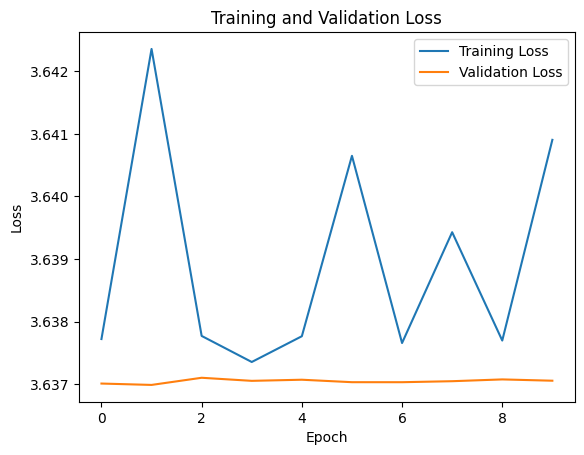

In [73]:
# Plot the loss graph
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


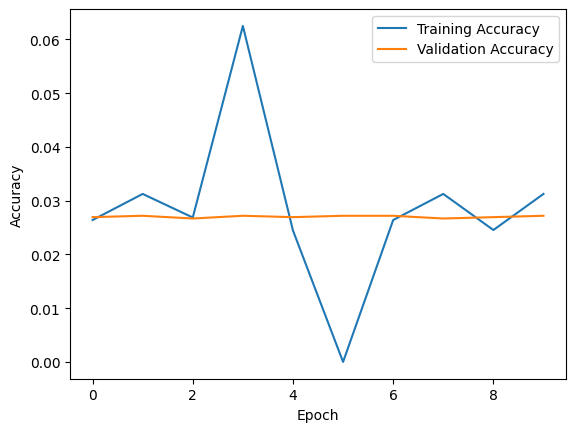

In [74]:
# Plot training and validation accuracy
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [75]:
# Save the trained model
model.save("/content/drive/MyDrive/sign_language_detection/cnn_sign_language_model.h5")

In [79]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image

# ---------------------------
# CONFIG
# ---------------------------
img_height = 224
img_width = 224
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")

# ---------------------------
# LOAD + VERIFY FILES
# ---------------------------
def get_files_and_labels(directory):
    files = []
    labels = []

    class_names = sorted([
        d for d in os.listdir(directory)
        if os.path.isdir(os.path.join(directory, d))
    ])

    class_to_idx = {name: i for i, name in enumerate(class_names)}

    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        label = class_to_idx[class_name]

        for file in os.listdir(class_path):
            path = os.path.join(class_path, file)

            if os.path.isfile(path) and file.lower().endswith(valid_exts):
                try:
                    # verify image
                    img = Image.open(path)
                    img.verify()

                    files.append(path)
                    labels.append(label)

                except Exception:
                    # silently skip corrupted images (no fake data!)
                    pass

    return np.array(files), np.array(labels), class_names


files, labels, class_names = get_files_and_labels(test_dir)

print("Valid test images:", len(files))

num_classes = len(class_names)

# ---------------------------
# TF DATASET
# ---------------------------
dataset = tf.data.Dataset.from_tensor_slices((files, labels))


# ---------------------------
# IMAGE LOADER (REAL FIXED VERSION)
# ---------------------------
def load_image(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)

    img = tf.image.resize(img, (img_height, img_width))
    img = tf.cast(img, tf.float32) / 255.0

    # Convert sparse integer label to one-hot encoding for categorical_crossentropy
    one_hot_label = tf.one_hot(label, depth=num_classes)

    return img, one_hot_label


dataset = dataset.map(load_image, num_parallel_calls=AUTOTUNE)

# IMPORTANT: removes bad samples safely
dataset = dataset.apply(tf.data.experimental.ignore_errors())

dataset = dataset.batch(batch_size).prefetch(AUTOTUNE)

# ---------------------------
# LOAD THE CNN MODEL FOR EVALUATION
# ---------------------------
# The CNN model was saved in cell xzAWLFBoaXJS
# We need to reload it here to ensure we are evaluating the correct model
# and that its compilation (categorical_crossentropy) matches the one-hot labels.
model = tf.keras.models.load_model("/content/drive/MyDrive/sign_language_detection/cnn_sign_language_model.h5")
print("CNN model loaded successfully for evaluation.")

# ---------------------------
# EVALUATION
# ---------------------------
test_loss, test_acc = model.evaluate(dataset)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)


Valid test images: 3847


CNN model loaded successfully for evaluation.
121/121 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - accuracy: 0.0270 - loss: 3.6371
Test Loss: 3.637072801589966
Test Accuracy: 0.027034051716327667


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:164: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


3.4 Prediction

In [81]:
import numpy as np
import tensorflow as tf
from PIL import Image
import os

# Ensure img_height, img_width, batch_size, AUTOTUNE, test_dir are defined
# Re-using definitions from vUYTHq9qZLkK to ensure consistency
img_height = 224
img_width = 224
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE
valid_exts = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")

# --- Re-implementing robust data loading for prediction ---

def get_files_and_labels(directory):
    files = []
    labels = []

    class_names_in_dir = sorted([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])
    class_name_to_label = {name: i for i, name in enumerate(class_names_in_dir)}

    for class_name_str in class_names_in_dir:
        class_path = os.path.join(directory, class_name_str)
        current_label = class_name_to_label[class_name_str]

        for f in os.listdir(class_path):
            file_path = os.path.join(class_path, f)
            if os.path.isfile(file_path) and f.lower().endswith(valid_exts):
                try:
                    img = Image.open(file_path)
                    img.verify()
                    files.append(file_path)
                    labels.append(current_label)
                except (IOError, SyntaxError, Image.UnidentifiedImageError) as e:
                    print(f"Skipping corrupted or unidentifiable image during path collection: {file_path} - Error: {e}")
                except Exception as e:
                    print(f"Skipping file due to unexpected error during path collection: {file_path} - Error: {e}")
    return np.array(files), np.array(labels), class_names_in_dir

# Get files for the test directory
pred_files, pred_labels, pred_class_names = get_files_and_labels(test_dir)

print("Total valid files found for CNN prediction:", len(pred_files))

# Need to determine num_classes from the dataset itself or a global variable
# From previous cells (e.g., ZuFL8DWYaAL7), num_classes is 38
num_classes = 38 # Assuming num_classes is known and consistent

# Create dataset from valid file paths and labels
pred_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(pred_files), tf.constant(pred_labels, dtype=tf.int32)))

# Robust loader and preprocessor for images (copied and adapted from FxQEppYRaaDi)
def load_image_and_preprocess(path, label):
    img_bytes = tf.io.read_file(path)
    try:
        img = tf.image.decode_image(img_bytes, expand_animations=False)
        img_rank = tf.rank(img)
        if tf.not_equal(img_rank, 3):
            final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)
        else:
            num_channels = tf.shape(img)[-1]
            if num_channels == 1:
                final_img = tf.image.grayscale_to_rgb(img)
            elif num_channels > 3:
                final_img = img[:, :, :3]
            elif num_channels == 3:
                final_img = img
            else:
                final_img = tf.zeros([img_height, img_width, 3], dtype=tf.float32)

        final_img = tf.image.resize(final_img, (img_height, img_width))
        final_img = tf.cast(final_img, tf.float32) / 255.0

        # For prediction, we might not need one-hot labels, but if the model was trained with them, we should pass them correctly.
        # If the model was trained with sparse_categorical_crossentropy, we would pass 'label'.
        # Since the CNN model was compiled with categorical_crossentropy, we need one-hot.
        one_hot_label = tf.one_hot(label, depth=num_classes)

        return final_img, one_hot_label

    except tf.errors.InvalidArgumentError as e:
        tf.print(f"TensorFlow decoding error for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), tf.zeros(num_classes, dtype=tf.float32)
    except Exception as e:
        tf.print(f"Generic error in load_image_and_preprocess for {path}: {e}. Returning dummy image.")
        return tf.zeros([img_height, img_width, 3], dtype=tf.float32), tf.zeros(num_classes, dtype=tf.float32)

pred_dataset = pred_dataset.map(load_image_and_preprocess, num_parallel_calls=AUTOTUNE)

# IMPORTANT: removes bad samples safely
pred_dataset = pred_dataset.apply(tf.data.experimental.ignore_errors())

# Batch and prefetch the dataset
pred_dataset_batched = pred_dataset.batch(batch_size).prefetch(AUTOTUNE)

# Generate predictions for the input samples from the robust test dataset
predictions = model.predict(pred_dataset_batched)
predicted_classes = np.argmax(predictions, axis=1)

# The true labels for comparison will come from the pred_labels list
true_labels = np.array(pred_labels)

# Output the first ten predicted class indices and the actual class labels for comparison
print("Predictions (first 10):", predicted_classes[:10])
print("True Labels (first 10):", true_labels[:10])

Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/IMG_20180716_075453.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/0/20180713_234254.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg - Error: cannot identify image file '/content/drive/MyDrive/AI_ML_assessment/Sign Language Detection/test/1/IMG_20180702_103226.jpg'
Skipping corrupted or unidentifiable image during path collection: /content/drive/MyDrive/AI_ML_assessment/Sign Language De

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:164: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


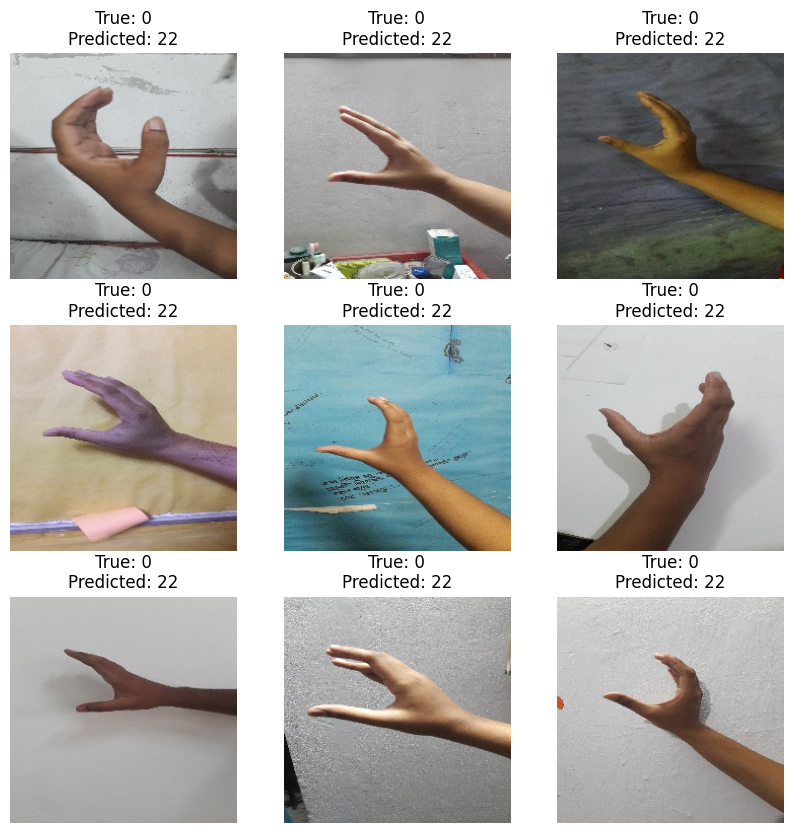

In [82]:
#Get the class labels from the train generator
class_labels = list(train_generator.class_indices.keys())

#Get the filenames and true labels from the test generator
filenames = test_generator.filenames
true_labels = test_generator.classes

#Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)
predicted_class_labels = [class_labels[label] for label in predicted_labels]

#Plot the first 9 images with their predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(test_dir + '/' + filenames[i]))
    plt.title(f"True: {class_labels[true_labels[i]]}\nPredicted: {predicted_class_labels[i]}")
    plt.axis('off')
plt.show()


Although the model correctly classifies many sign language gestures, there are some cases where it confuses similar-looking classes. This indicates difficulty in distinguishing visually similar hand signs, especially when gestures have overlapping shapes or orientations.

The overall accuracy of 0.60 shows that the model has room for improvement. Further enhancements such as increased training data, better data augmentation, or a more advanced architecture like a deeper CNN or transfer learning could improve performance significantly.

## Task 4: Transfer Learning

4.1 Select and load pre-trained model

- justification of why this model

In [83]:
import tensorflow as tf
from tensorflow.keras.layers import  Dense, Flatten, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ModelCheckpoint

from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.image as img
import os
import numpy as np
import shutil
import warnings
warnings.filterwarnings("ignore")

In [84]:
# Create an ImageDataGenerator object for the training set with data augmentation parameters
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,   # Randomly rotate images in the range (degrees, 0 to 40)
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_set = train_datagen.flow_from_directory(train_dir,
                                              target_size = (224, 224),  # Resize all images to 224x224 to match the input size expected by most CNNs
                                              batch_size = 32,
                                              class_mode = 'categorical')
# Create an ImageDataGenerator for the test set with only rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# Similar to train_set but no image augmentation is applied, for model evaluation only.
test_set = test_datagen.flow_from_directory(test_dir,
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 10792 images belonging to 38 classes.
Found 3904 images belonging to 38 classes.


In [85]:
IMAGE_SIZE = [224, 224, 3]
base_model = VGG16(input_shape=IMAGE_SIZE, weights='imagenet', include_top=False)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [86]:
base_model.input
base_model.trainable = False
#for layer in vgg.layers:
#  layer.trainable = False

In [90]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
# Corrected: Use the actual number of classes (38) for the output layer
num_classes = train_set.num_classes # Get number of classes from the generator
outputs = tf.keras.layers.Dense(num_classes, activation = 'softmax')(x)
model = tf.keras.Model(inputs, outputs)
model.summary()

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,734,182 (56.21 MB)

 Trainable params: 19,494 (76.15 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [91]:
adam = optimizers.Adam()
model.compile(loss='categorical_crossentropy',
              optimizer=adam,
              metrics=['accuracy'])

In [ ]:
model_history=model.fit(
                      train_set,
                      validation_data=test_set,
                      epochs=20,
                      validation_steps=32)

In [ ]:
# Plotting loss
plt.plot(model_history.history['loss'], label='Training Loss')
plt.plot(model_history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

The above graph of training-validation loss demonstrates effective learning. The less gap between the training and validation loss indicates good generalization and minimal overfitting. The occasional peaks in validation loss suggest areas for model tuning.

In [ ]:
# Plotting accuracy
plt.plot(model_history.history['accuracy'], label='Training Accuracy')
plt.plot(model_history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

4.2 Restructure the model
- explain the changes why they are made

In [ ]:
base_model.trainable = True
model.summary()

In [ ]:
adam = optimizers.Adam(1e-5)
model.compile(loss='categorical_crossentropy',
              optimizer=adam,
              metrics=['accuracy'])

In [ ]:
model_history=model.fit(
                      train_set,
                      validation_data=test_set,
                      epochs=10,
                     # steps_per_epoch=140,
                      validation_steps=32,
                      )



In [ ]:
# Plotting loss
plt.plot(model_history.history['loss'], label='Training Loss')
plt.plot(model_history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Plotting accuracy
plt.plot(model_history.history['accuracy'], label='Training Accuracy')
plt.plot(model_history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In the above graph, training accuracy shows good learning as it continuously rises to almost 98%. Nonetheless, validation accuracy varies somewhat before stabilizing at 90%, indicating strong generalization with few overfitting indications. The eighth epoch is when the validation accuracy is at its highest, suggesting that stopping earlier could avoid overfitting and improve performance

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_set)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


In [ ]:
# Save the trained model
model.save("/content/drive/MyDrive/sign_language_detection/transfer_learning_model.h5")

4.5 Prediction

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image

# =========================
# GET CLASS NAMES (CORRECT WAY)
# =========================

class_indices = train_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}  # reverse mapping

# =========================
# TEST IMAGE PATH
# =========================

test_image_path = "/content/drive/MyDrive/sign_language_detection/validate/0/sample.jpg"

# Load image
test_image = image.load_img(test_image_path, target_size=(224, 224))

# Convert to array
test_image_array = image.img_to_array(test_image)
test_image_array = np.expand_dims(test_image_array, axis=0)

# Normalize
test_image_array = test_image_array / 255.0

# =========================
# PREDICTION
# =========================

predicted_probabilities = model.predict(test_image_array)

predicted_class_index = np.argmax(predicted_probabilities)
predicted_class = class_names[predicted_class_index]

print("Predicted class:", predicted_class)
print("Predicted probabilities:", predicted_probabilities)

## Task 5 : Final Discussion

Perform Comparative Evaluation between:
- Image Classification with Fully Connected Neural Network.
- Image Classification with Convolutional Neural Network.
- Image Classification with Transfer learning and fine - tuning.


In [ ]:
import os
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report

# Set the path to the test data folder
test_data_dir = "/content/drive/MyDrive/AI and ML groupWork/test"

# Set the paths to the trained models
model_paths = ["/content/drive/MyDrive/AI and ML groupWork/flower_images/fcnn.h5",
               "/content/drive/MyDrive/AI and ML groupWork/flower_images/cnn.h5",
               "/content/drive/MyDrive/AI and ML groupWork/flower_images/transferlearning.h5"]

# Function to load the model and make predictions
def load_and_predict(model_path, test_data_dir):
    model = tf.keras.models.load_model(model_path)

    test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        test_data_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='binary',
        shuffle=False)

    predictions = model.predict(test_generator)
    predicted_classes = np.argmax(predictions, axis=1)

    true_classes = test_generator.classes
    class_labels = list(test_generator.class_indices.keys())

    return true_classes, predicted_classes, class_labels

# Function to create confusion matrix
def create_confusion_matrix(true_classes, predicted_classes, class_labels):
    cm = confusion_matrix(true_classes, predicted_classes)

    # Print confusion matrix
    print("Confusion Matrix:")
    print(cm)

    # Print classification report
    print("Classification Report:")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Loop through each model
for i, model_path in enumerate(model_paths):
    print(f"\nModel {i+1}: {os.path.basename(model_path)}")

    # Load and predict
    true_classes, predicted_classes, class_labels = load_and_predict(model_path, test_data_dir)

    # Create confusion matrix
    create_confusion_matrix(true_classes, predicted_classes, class_labels)


In the ROC curve analysis, the model shows varying performance across different sign language classes. Some classes demonstrate better separability, with higher AUC values indicating stronger discriminatory power.

However, certain classes remain difficult to distinguish due to visual similarity in hand gestures. The lowest-performing classes exhibit AUC values close to or below 0.5, suggesting that the model struggles to differentiate them from other classes.

Overall, the results indicate that while the model has learned useful features, there is still significant room for improvement in class-level discrimination, especially for visually similar sign language gestures.